In [18]:
import os
import itertools
import math

import sklearn.model_selection
import random
import torch
import torchvision

import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import pandas as pd
import numpy as np

In [2]:
torch.manual_seed(0)
random.seed(0)
SKLEARN_RANDOM_SEED = 0

MAX_BYTE = 255
NUM_EPOCHS = 200
BATCH_SIZE = 16
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("mps") if torch.backends.mps.is_available() else torch.device("cpu")

# Extract and organize data

In [3]:
quality_ratings = ["Pasul", "A", "AA", "Muvhar"]
IMG_HEIGHT = 323
COLLAGE_COLS = 5

img_shapes = [(3,), tuple(IMG_HEIGHT*i+1 for i in [1,2,3]), (1616,)]
example_collage = torchvision.io.read_image(os.path.join("Pasul", os.listdir("Pasul")[1]))
vertical_dividers = [col for col in range(img_shapes[2][0]) if (example_collage[:,:,col] == torch.full((3, img_shapes[1][-1]), 255)).all()]
horizontal_dividers = [row for row in range(img_shapes[1][-1]) if (example_collage[:,row,:] == torch.full((3, img_shapes[2][0]), 255)).all()]

class Fruit:
    def __init__(self, serial_num, collage, camera, rating):
        self.serial_num = serial_num
        self.images = self._imgs_from_collage(collage)
        self.camera = camera
        self.quality_rating = rating

    @staticmethod
    def _imgs_from_collage(collage):
        num_img_rows = collage.shape[1] // IMG_HEIGHT
        imgs = torch.stack([
            Fruit._img_from_collage(collage, img_row, img_col)
            for img_row, img_col in itertools.product(range(num_img_rows), range(COLLAGE_COLS))
            if not (
                Fruit._img_from_collage(collage, img_row, img_col) == torch.zeros_like(Fruit._img_from_collage(collage, img_row, img_col))
            ).all()
        ])
        return imgs

    @staticmethod
    def _img_from_collage(collage, img_row, img_col):
        return collage[
            :,
            horizontal_dividers[img_row]+1 : horizontal_dividers[img_row+1], 
            vertical_dividers[img_col]+1 : vertical_dividers[img_col+1]
        ]

print("Loading images from file")
fruits = {
    quality_rating: [
        Fruit(
            serial_num=img_name[24:24+13],
            collage=torchvision.io.read_image(os.path.join(quality_rating, img_name)),
            camera=int(img_name[44:44+2]),
            rating=quality_rating
        )
        for img_name in tqdm(os.listdir(quality_rating))
    ]
    for quality_rating in quality_ratings
}  # Can be parallelized with Numba but unnecessary for small dataset provided

Loading images from file


  0%|          | 0/153 [00:00<?, ?it/s]

  0%|          | 0/176 [00:00<?, ?it/s]

  0%|          | 0/189 [00:00<?, ?it/s]

  0%|          | 0/224 [00:00<?, ?it/s]

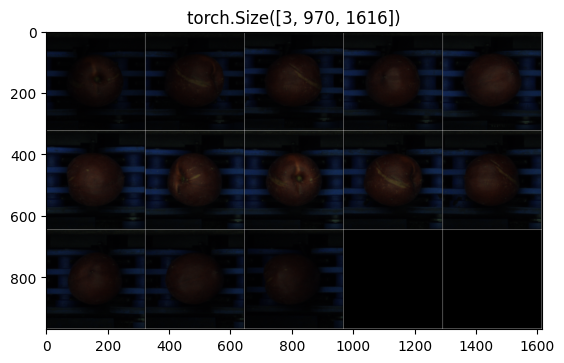

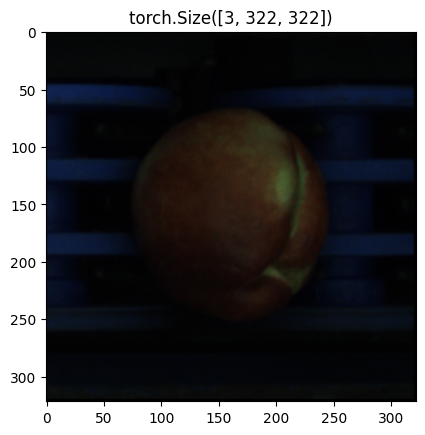

In [4]:
plt.title(example_collage.shape)
plt.imshow(example_collage.permute(1,2,0))
plt.show()

example_img = fruits["Pasul"][0].images[0]
plt.title(example_img.shape)
plt.imshow(example_img.permute(1,2,0))
plt.show()

# Modelling

## Data

In [5]:
max_imgs_per_fruit = max([max([fruit.images.shape[0] for fruit in fruits[rating]]) for rating in quality_ratings])

Different fruits have different numbers of images.  How are we to represent a fruit?  A few options (in order of rising complexity) are:
- Replace the missing images with zeros (black images).  Not implemented.
- <b>Fully classify each image on its own and then take the minimal rating.</b>  This approach is a direct application of the rule that a fruit is judged by its worst POV, and is a priori probably the best implementation.
- Compute an embedding for each image, aggregate, and then classify the aggregated embedding.  This has the benefit of giving the model all possible data when considering a fruit, which can be useful for discovering a priori unknown signs of a given rating (e.g. although we would imagine at first that the only relevant signs are those on the surface of the fruit such as holes or rot, perhaps in fact the shape of the fruit can provide additional information relevant to its rating.  The shape is most easily obtained by considering multiple views of the fruit).

In [6]:
all_fruits = list(itertools.chain.from_iterable(fruits.values()))
# all_fruits = all_fruits[:3]  # DEBUG
train_eval_fruits, test_fruits = sklearn.model_selection.train_test_split(
    all_fruits,
    random_state=SKLEARN_RANDOM_SEED
)
train_fruits, eval_fruits = sklearn.model_selection.train_test_split(
    train_eval_fruits, 
    test_size=0.1,  # Small eval set because insufficient data
    train_size=1-0.1,
    random_state=SKLEARN_RANDOM_SEED+1
)
train_ds = torch.utils.data.TensorDataset(
    torch.stack([torch.nn.functional.pad(fruit.images, (0,0, 0,0, 0,0, 0,max_imgs_per_fruit-fruit.images.shape[0])) for fruit in train_fruits]),
    torch.tensor([fruit.images.shape[0] for fruit in train_fruits]),
    torch.tensor([quality_ratings.index(fruit.quality_rating) for fruit in train_fruits])
)
eval_ds = torch.utils.data.TensorDataset(
    torch.stack([torch.nn.functional.pad(fruit.images, (0,0, 0,0, 0,0, 0,max_imgs_per_fruit-fruit.images.shape[0])) for fruit in eval_fruits]),
    torch.tensor([fruit.images.shape[0] for fruit in eval_fruits]),
    torch.tensor([quality_ratings.index(fruit.quality_rating) for fruit in eval_fruits])
)
test_ds = torch.utils.data.TensorDataset(
    torch.stack([torch.nn.functional.pad(fruit.images, (0,0, 0,0, 0,0, 0,max_imgs_per_fruit-fruit.images.shape[0])) for fruit in test_fruits]),
    torch.tensor([fruit.images.shape[0] for fruit in test_fruits]),
    torch.tensor([quality_ratings.index(fruit.quality_rating) for fruit in test_fruits])
)

# Images are zero-padded on the end up to the max number of images for a given fruit.
# Labels are tuples (unpadded_number_of_fruit_images, class) with 0 <= class <= 3
train_dl = torch.utils.data.DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True)
eval_dl = torch.utils.data.DataLoader(eval_ds, batch_size=BATCH_SIZE, shuffle=False)
test_dl = torch.utils.data.DataLoader(test_ds, batch_size=BATCH_SIZE, shuffle=False)

Some transforms we would like to attain invariance to are:
- Flip (horizontal and vertical)
- Lighting change (lack of normalization)
- Rotation (since a fruit does not change its rating by being rotated)

These may be addressed with the relevant 
image augmentations

# Model

## Network architecture

In [8]:
class ImglayerToFruitlayer(torch.nn.Module):
        # Torchscript decorator for applying layers meant for images to collections of images (apply the layer to each image)
        def __init__(self, imglayer):
            super().__init__()
            self.imglayer = imglayer
            
        def forward(self, *batch_fruit_imgs):
            imgs_per_fruit = batch_fruit_imgs[0].shape[1]
            mixed_fruits_and_imgs = tuple(
                batch_fruit_imgs_tensor.reshape(-1, *batch_fruit_imgs_tensor.shape[2:]) 
                for batch_fruit_imgs_tensor in batch_fruit_imgs
            )
            processed_imgs = self.imglayer(*mixed_fruits_and_imgs)
            return processed_imgs.reshape(-1, imgs_per_fruit, *processed_imgs.shape[1:])


class ResidualConnection(torch.nn.Module):
    def __init__(self, in_shape, out_shape):
        super().__init__()
        self.channel_adapt = torch.nn.Conv2d(in_shape[0], out_shape[0], kernel_size=(1,1))
        self.height_adapt = torch.nn.Parameter(torch.empty(1, out_shape[1], in_shape[1]))
        torch.nn.init.xavier_normal_(self.height_adapt)
        self.width_adapt = torch.nn.Parameter(torch.empty(1, in_shape[2], out_shape[2]))
        torch.nn.init.xavier_normal_(self.width_adapt)

    def forward(self, new_img, old_img):
        return new_img + self.channel_adapt(self.height_adapt @ old_img @ self.width_adapt)

In [9]:
class FruitQualityClassifier(torch.nn.Module):
    def __init__(self):
        super().__init__()
        
        self.norm0 = ImglayerToFruitlayer(torch.nn.BatchNorm2d(3, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True))
        self.conv0 = ImglayerToFruitlayer(torch.nn.Conv2d(3, 64, kernel_size=(5, 5), stride=(2, 2), padding=(3, 3), bias=False))
        self.activation0 = torch.nn.GELU()
        self.pool0 = ImglayerToFruitlayer(torch.nn.AvgPool2d(kernel_size=3, stride=2, padding=1, ceil_mode=False, divisor_override=1))
        self.residual0 = ImglayerToFruitlayer(ResidualConnection((3,322,322), (64,81,81)))

        self.norm1 = ImglayerToFruitlayer(torch.nn.BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True))
        self.conv1 = ImglayerToFruitlayer(torch.nn.Conv2d(64, 32, kernel_size=(5, 5), stride=(2, 2), padding=(3, 3), bias=False))
        self.activation1 = torch.nn.GELU()
        self.pool1 = ImglayerToFruitlayer(torch.nn.AvgPool2d(kernel_size=3, stride=2, padding=1, ceil_mode=False, divisor_override=1))
        self.residual1 = ImglayerToFruitlayer(ResidualConnection((64,81,81), (32,21,21)))

        self.norm2 = ImglayerToFruitlayer(torch.nn.BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True))
        self.conv2 = ImglayerToFruitlayer(torch.nn.Conv2d(32, 32, kernel_size=(5, 5), stride=(2, 2), padding=(3, 3), bias=False))
        self.activation2 = torch.nn.GELU()
        self.residual2 = ImglayerToFruitlayer(ResidualConnection((32,21,21), (32,12,12)))

        self.trained_feature_extractor_output_shape = 32, 12, 12
        self.classifier_head = ImglayerToFruitlayer(torch.nn.Sequential(
            torch.nn.Flatten(start_dim=1),
            torch.nn.Linear(math.prod(self.trained_feature_extractor_output_shape), 4)
        ))

    
    def forward(self, batch_fruit_imgs, batch_num_imgs):
        fruit_ftrs0 = self.norm0(batch_fruit_imgs)
        fruit_ftrs0 = self.conv0(fruit_ftrs0)
        fruit_ftrs0 = self.activation0(fruit_ftrs0)
        fruit_ftrs0 = self.pool0(fruit_ftrs0)
        fruit_ftrs0 = self.residual0(fruit_ftrs0, batch_fruit_imgs)

        fruit_ftrs1 = self.norm1(fruit_ftrs0)
        fruit_ftrs1 = self.conv1(fruit_ftrs1)
        fruit_ftrs1 = self.activation1(fruit_ftrs1)
        fruit_ftrs1 = self.pool1(fruit_ftrs1)
        fruit_ftrs1 = self.residual1(fruit_ftrs1, fruit_ftrs0)

        fruit_ftrs2 = self.norm2(fruit_ftrs1)
        fruit_ftrs2 = self.conv2(fruit_ftrs2)
        fruit_ftrs2 = self.activation2(fruit_ftrs2)
        fruit_ftrs2 = self.residual2(fruit_ftrs2, fruit_ftrs1)
        
        class_distributions_per_image = self.classifier_head(fruit_ftrs2)
        # overwrite rating predictions of pad images (implemented by repeating prediction of last nonpad image)
        class_distributions_per_nonpad_image = class_distributions_per_image.gather(  
            index=torch.min(
                torch.arange(class_distributions_per_image.shape[1], device=class_distributions_per_image.device)\
                    .unsqueeze(0).unsqueeze(2).expand_as(class_distributions_per_image),
                batch_num_imgs.unsqueeze(1).unsqueeze(2) - 1  # Identity gather, clipped to last nonpad image
            ),
            dim=1
        )
        worst_img = class_distributions_per_nonpad_image.max(dim=2).indices.min(dim=1).values
        preds_per_fruit = class_distributions_per_nonpad_image[torch.arange(class_distributions_per_nonpad_image.shape[0]), worst_img, :]
        return preds_per_fruit


model = FruitQualityClassifier().to(device)

## Training architecture

In [10]:
loss_fn = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3, weight_decay=1e-3)

## Train loop

In [12]:
train_transforms = ImglayerToFruitlayer(
    torch.nn.Sequential(
        torchvision.transforms.Normalize(mean=0, std=1),
        torchvision.transforms.RandomHorizontalFlip(),
        torchvision.transforms.RandomVerticalFlip()
    )
)
test_transforms = ImglayerToFruitlayer(torchvision.transforms.Normalize(mean=0, std=1))

In [154]:
def eval_model(model, eval_dl):
    total_correct = 0
    total_samples = 0
    for fruit_imgs, num_imgs, targets in eval_dl:
        fruit_imgs, num_imgs, targets = fruit_imgs.to(device), num_imgs.to(device), targets.to(device)
        fruit_imgs = fruit_imgs/MAX_BYTE if fruit_imgs.dtype==torch.uint8 else fruit_imgs
        total_samples += targets.shape[0]
        fruit_imgs = test_transforms(fruit_imgs)
        preds = model(fruit_imgs, num_imgs).max(dim=1).indices
        total_correct += (targets == preds).sum()
        if total_correct > total_samples:
            raise Exception
    return total_correct / total_samples

Current best eval accuracy: 0.64


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 0 completed with eval accuracy 0.589


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 1 completed with eval accuracy 0.5


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 2 completed with eval accuracy 0.589


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 3 completed with eval accuracy 0.554


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 4 completed with eval accuracy 0.607


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 5 completed with eval accuracy 0.536


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 6 completed with eval accuracy 0.625


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 7 completed with eval accuracy 0.5


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 8 completed with eval accuracy 0.571


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 9 completed with eval accuracy 0.607


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 10 completed with eval accuracy 0.589


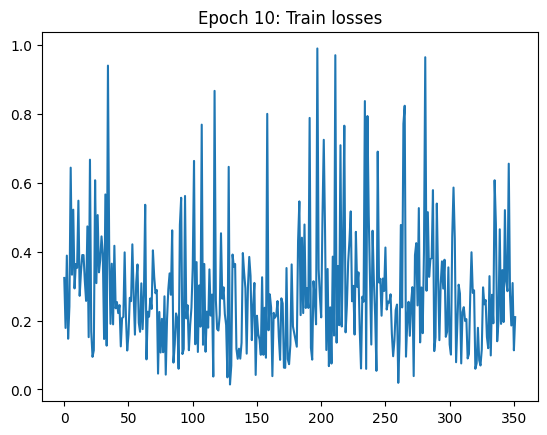

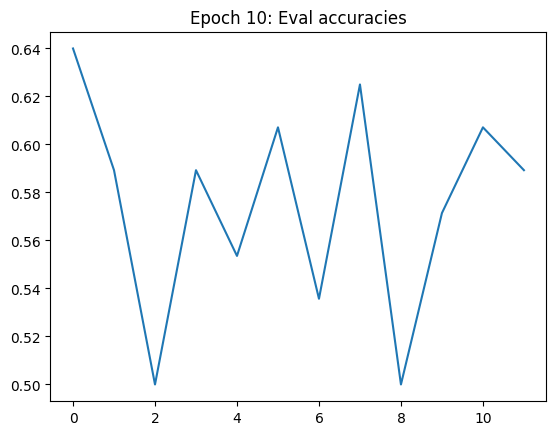

  0%|          | 0/32 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [129]:
# %debug
losses, eval_accuracies = [], [0.64]
GRAPH_EVERY = 10
eval_accuracy = 0

print(f"Current best eval accuracy: {max(eval_accuracies)}")
for epoch in range(NUM_EPOCHS):
    for fruit_imgs, num_imgs, targets in (pbar := tqdm(train_dl)):
        # fruit_imgs.shape: batch_size x imgs_per_fruit x color_channels x height x width
        fruit_imgs, num_imgs, targets = fruit_imgs.to(device), num_imgs.to(device), targets.to(device)
        fruit_imgs = fruit_imgs/MAX_BYTE if fruit_imgs.dtype==torch.uint8 else fruit_imgs
        fruit_imgs = train_transforms(fruit_imgs)
        preds = model(fruit_imgs, num_imgs)
        loss = loss_fn(preds, torch.nn.functional.one_hot(targets, num_classes=4).to(torch.float32))
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
        pbar.set_description(f"Train loss: {round(loss.cpu().item(), 3)}")
        losses.append(loss.cpu().item())
    eval_accuracy = eval_model(model, eval_dl)
    print(f"Epoch {epoch} completed with eval accuracy {round(eval_accuracy.cpu().item(), 3)}")
    eval_accuracies.append(eval_accuracy.cpu().item())

    # Early stopping
    if eval_accuracy >= max(eval_accuracies):
        print("Saving model")
        with open(f"cnn_model_weights_CNNClass_acc{round(eval_accuracy.cpu().item(), 2)}.pth", "wb") as model_save_file:
            torch.save(model, model_save_file)

    if epoch % GRAPH_EVERY == 0 and epoch != 0:
        plt.plot(losses)
        plt.title(f"Epoch {epoch}: Train losses")
        plt.show()
        plt.plot(eval_accuracies)
        plt.title(f"Epoch {epoch}: Eval accuracies")
        plt.show()

# Test

In [13]:
model = torch.load("cnn_model_weights_CNNClass_acc0.64.pth")
test_acc = eval_model(model, test_dl)
test_acc

tensor(0.5860, device='mps:0')

# Model analysis

In [54]:
predicted_labels = []
target_labels = []
distances = []
entropies = []

with torch.no_grad():
    for fruit_imgs, num_imgs, targets in (pbar := tqdm(test_dl)):
        # fruit_imgs.shape: batch_size x imgs_per_fruit x color_channels x height x width
        fruit_imgs, num_imgs, targets = fruit_imgs.to(device), num_imgs.to(device), targets.to(device)
        fruit_imgs = fruit_imgs/MAX_BYTE if fruit_imgs.dtype==torch.uint8 else fruit_imgs
        fruit_imgs = test_transforms(fruit_imgs)
        prediction_distributions = model(fruit_imgs, num_imgs)
        preds = prediction_distributions.max(dim=1).indices
        
        predicted_labels = predicted_labels + preds.cpu().tolist()
        target_labels = target_labels + targets.cpu().tolist()
        distances = distances + torch.abs(preds-targets).cpu().tolist()
        batch_entropies = -(torch.softmax(prediction_distributions, dim=1) * torch.log(torch.softmax(prediction_distributions, dim=1))).sum(dim=1)
        entropies = entropies + batch_entropies.tolist()

test_analysis_df = pd.DataFrame({
    "Predicted labels": predicted_labels,
    "Target labels": target_labels,
    "Prediction-target distances": distances,
    "Prediction distribution entropies": entropies
}).sort_values(["Prediction distribution entropies"])
test_analysis_df

  0%|          | 0/12 [00:00<?, ?it/s]

,Predicted labels,Target labels,Prediction-target distances,Prediction distribution entropies
57,3,3,0,3.004016e-07
171,3,3,0,3.224675e-07
150,3,3,0,1.403972e-06
31,3,3,0,3.561858e-06
159,3,3,0,8.044880e-06
...,...,...,...,...
76,1,2,1,1.278749e+00
69,1,1,0,1.297317e+00
67,2,2,0,1.340532e+00
13,0,1,1,1.350442e+00


## Entropy thresholding

The model may at times be confused by fruits whose classification it is unsure of, particularly when the correct class is adjacent to the predicted class.  Greater accuracy may be obtained by sending fruit that it is unsure about (as measured by the model's prediction distribution entropy) to an external system, whether that is a human arbiter or a model with greater expertise (which I have not provided here due to hardware and data constraints).

Text(0.5, 1.0, 'MAE reduction by entropy thresholding')

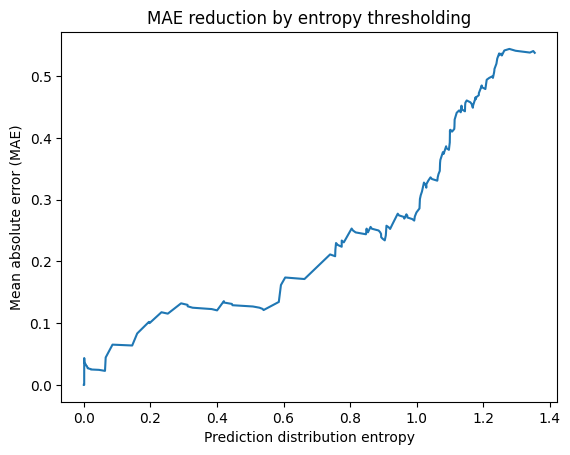

In [73]:
plt.plot(
    test_analysis_df["Prediction distribution entropies"].reset_index(drop=True),
    test_analysis_df["Prediction-target distances"].reset_index(drop=True).cumsum() / (1 + np.arange(len(test_analysis_df)))
)
plt.xlabel("Prediction distribution entropy")
plt.ylabel("Mean absolute error (MAE)")
plt.title("MAE reduction by entropy thresholding")

## Model bias

To determine if the model is biased towards a certain class, we measure the KL divergence between the model's classification distribution and the true test class distribution.

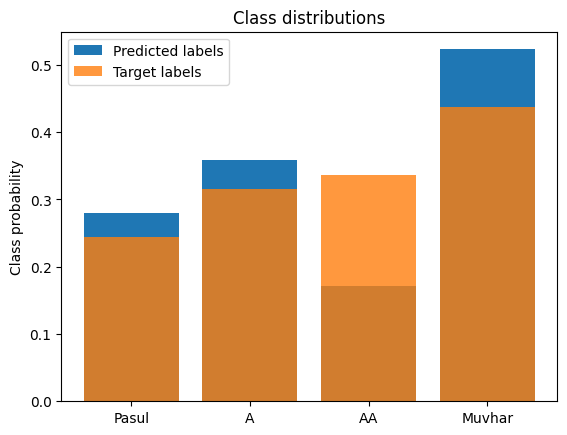

KL divergence: 0.07415183211932612


In [118]:
predicted_class_dist = np.histogram(test_analysis_df["Predicted labels"], bins=4, density=True)[0]
target_class_dist = np.histogram(test_analysis_df["Target labels"], bins=4, density=True)[0]
plt.bar([0,1,2,3], predicted_class_dist, tick_label=["Pasul","A","AA","Muvhar"], label="Predicted labels")
plt.bar([0,1,2,3], target_class_dist, tick_label=["Pasul","A","AA","Muvhar"], label="Target labels", alpha=0.8)
plt.legend()
plt.title("Class distributions")
plt.ylabel("Class probability")
plt.show()

kl_divergence = (target_class_dist * np.log(target_class_dist / predicted_class_dist)).sum()
print(f"KL divergence: {kl_divergence}")

We can see pretty clearly that the model is biased away from the AA class, but otherwise pretty close to the target class distribution.  We see that the model is minorly biased towards "Muvhar", so it likely has trouble differentiating between the two.

## Visualize misclassifications

In order to understand why the model made certain mistakes, we visualize the fruits it misclassified.  For clarity of visualization, we visualize only the first 5 images of each fruit so that each row can represent a single fruit without overly small images.

In [204]:
def normalize_img(img):
    return (img-img.min())/(img.max()-img.min())

Mistakenly predicted as Pasul


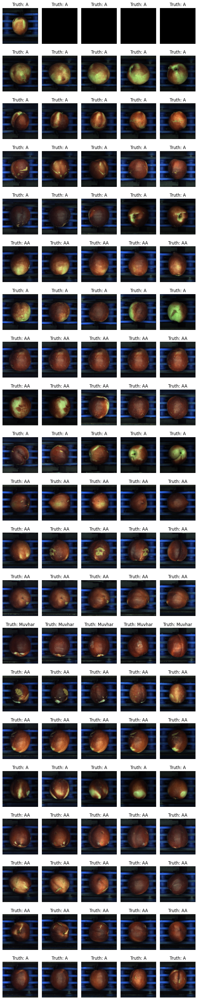

Mistakenly predicted as A


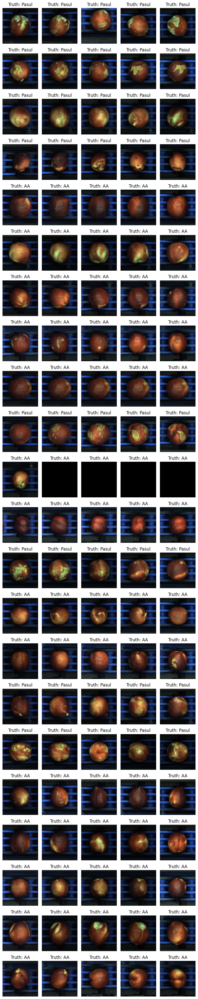

Mistakenly predicted as AA


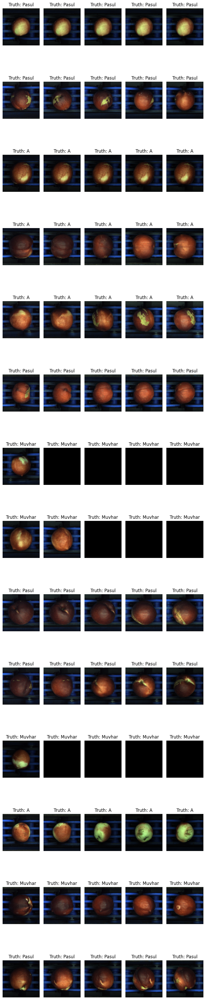

Mistakenly predicted as Muvhar


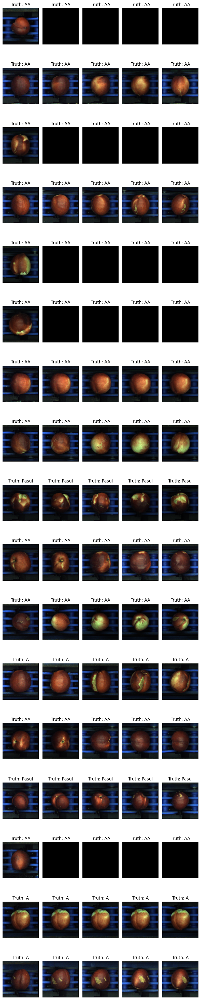

In [209]:
misclassified_fruits = [
    test_ds[test_analysis_df[np.logical_and(test_analysis_df["Target labels"] != i, test_analysis_df["Predicted labels"] == i)].index]
    for i in range(len(quality_ratings))
]

for metric_num, misclassifieds in enumerate(misclassified_fruits):
    fig, axeslist = plt.subplots(ncols=5, nrows=len(misclassifieds[0]), figsize=(8.0,40.0))
    print(f"Mistakenly predicted as {quality_ratings[metric_num]}")
    for fruit_num, fruit in enumerate(zip(*misclassifieds)):
        for img_num, img in enumerate(fruit[0]):
            axeslist[fruit_num][img_num].set_title(f"Truth: {quality_ratings[fruit[2]]}")
            axeslist[fruit_num][img_num].imshow(normalize_img(img).permute(1,2,0))
            axeslist[fruit_num][img_num].set_axis_off()
            if img_num == 4:
                break
    plt.tight_layout()
    plt.show()

As we can see, most misclassifications are for classes adjacent to the correct classes.  Additionally, many of the images are sufficiently close to the threshold that even humans may not be certain of the true classification.  Lastly (and most importantly for our purposes), it's not clear specifically what to do to the data to improve the classifications (besides edge filtering, which we tried separately and did not improve accuracy due to hardware constraints).